In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
df = pd.read_csv("Heart.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         303 non-null    int64  
 1   Age        303 non-null    int64  
 2   Sex        303 non-null    int64  
 3   ChestPain  303 non-null    object 
 4   RestBP     303 non-null    int64  
 5   Chol       303 non-null    int64  
 6   Fbs        303 non-null    int64  
 7   RestECG    303 non-null    int64  
 8   MaxHR      303 non-null    int64  
 9   ExAng      303 non-null    int64  
 10  Oldpeak    303 non-null    float64
 11  Slope      303 non-null    int64  
 12  Ca         299 non-null    float64
 13  Thal       301 non-null    object 
 14  AHD        303 non-null    object 
dtypes: float64(2), int64(10), object(3)
memory usage: 35.6+ KB


In [5]:
df.head()

,ID,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal,AHD
0,1,63,1,typical,145,233,1,2,150,0,2.3,3,0.0,fixed,No
1,2,67,1,asymptomatic,160,286,0,2,108,1,1.5,2,3.0,normal,Yes
2,3,67,1,asymptomatic,120,229,0,2,129,1,2.6,2,2.0,reversable,Yes
3,4,37,1,nonanginal,130,250,0,0,187,0,3.5,3,0.0,normal,No
4,5,41,0,nontypical,130,204,0,2,172,0,1.4,1,0.0,normal,No


In [6]:
df.describe()

,ID,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000
mean,152.000000,54.438944,0.679868,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241
std,87.612784,9.038662,0.467299,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438
min,1.000000,29.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,76.500000,48.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000
50%,152.000000,56.000000,1.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000
75%,227.500000,61.000000,1.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000
max,303.000000,77.000000,1.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000


<AxesSubplot:>

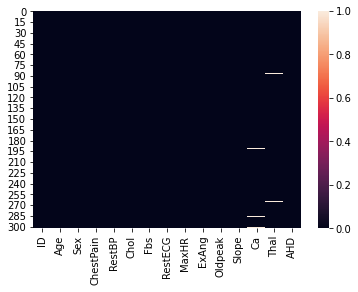

In [7]:
sns.heatmap(df.isnull())

# Data Cleaning

### Handling Null values

In [8]:
df['Ca'].unique()

array([ 0.,  3.,  2.,  1., nan])

In [9]:
df['Thal'].unique()

array(['fixed', 'normal', 'reversable', nan], dtype=object)

In [10]:
df['Ca'].fillna(df['Ca'].mode()[0], inplace = True)
df['Thal'].fillna(df['Thal'].mode()[0], inplace = True)
df.isnull().sum()

ID           0
Age          0
Sex          0
ChestPain    0
RestBP       0
Chol         0
Fbs          0
RestECG      0
MaxHR        0
ExAng        0
Oldpeak      0
Slope        0
Ca           0
Thal         0
AHD          0
dtype: int64

### One hot encoding

In [11]:
dummies = pd.get_dummies(df[['ChestPain', 'Thal', 'AHD']])
dummies.drop(['ChestPain_nontypical', 'Thal_normal', 'AHD_No'], axis = 1, inplace = True)
dummies

,ChestPain_asymptomatic,ChestPain_nonanginal,ChestPain_typical,Thal_fixed,Thal_reversable,AHD_Yes
0,0,0,1,1,0,0
1,1,0,0,0,0,1
2,1,0,0,0,1,1
3,0,1,0,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
298,0,0,1,0,1,1
299,1,0,0,0,1,1
300,1,0,0,0,1,1
301,0,0,0,0,0,1


In [12]:
df = pd.concat([df.drop(['ChestPain', 'Thal', 'AHD'], axis = 1), dummies], axis = 1)
df

,ID,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,ChestPain_asymptomatic,ChestPain_nonanginal,ChestPain_typical,Thal_fixed,Thal_reversable,AHD_Yes
0,1,63,1,145,233,1,2,150,0,2.3,3,0.0,0,0,1,1,0,0
1,2,67,1,160,286,0,2,108,1,1.5,2,3.0,1,0,0,0,0,1
2,3,67,1,120,229,0,2,129,1,2.6,2,2.0,1,0,0,0,1,1
3,4,37,1,130,250,0,0,187,0,3.5,3,0.0,0,1,0,0,0,0
4,5,41,0,130,204,0,2,172,0,1.4,1,0.0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,299,45,1,110,264,0,0,132,0,1.2,2,0.0,0,0,1,0,1,1
299,300,68,1,144,193,1,0,141,0,3.4,2,2.0,1,0,0,0,1,1
300,301,57,1,130,131,0,0,115,1,1.2,2,1.0,1,0,0,0,1,1
301,302,57,0,130,236,0,2,174,0,0.0,2,1.0,0,0,0,0,0,1


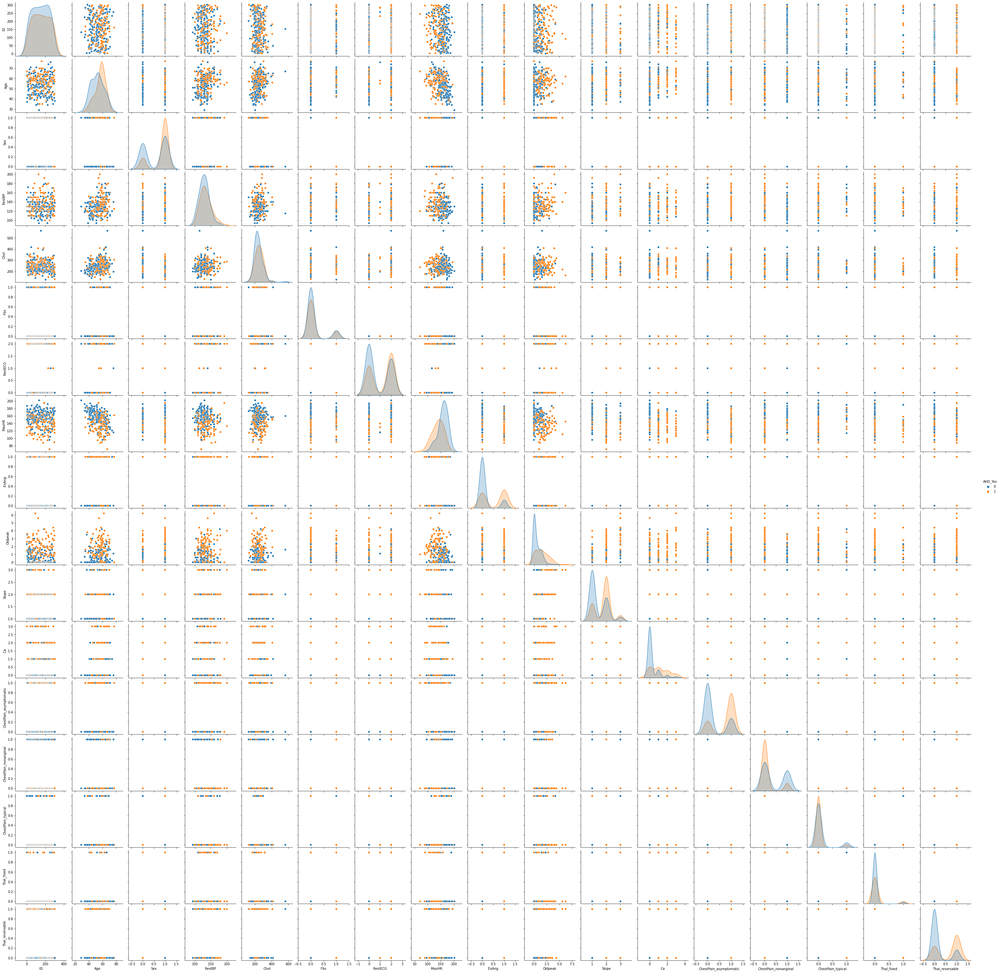

In [89]:
sns.pairplot(df, hue = 'AHD_Yes')

# Training

In [13]:
from sklearn.model_selection import train_test_split
X_t, X_test, y_t, y_test = train_test_split(df.drop('AHD_Yes', axis = 1), df['AHD_Yes'], test_size = 0.3, random_state=101)
X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size = 0.3, random_state=101)

## Decision Tree

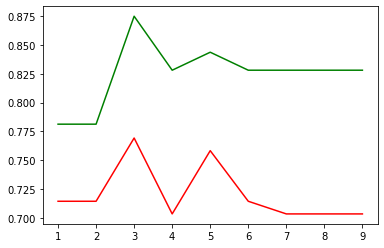

In [14]:
from sklearn.tree import DecisionTreeClassifier
# At about 2 it looks like it is working the best
k = 10
scores_val = []
scores_test = []
for i in range(1,k):
    heart_dec_tree_model = DecisionTreeClassifier(max_depth = i, random_state = 101)
    heart_dec_tree_model.fit(X_train, y_train)
    scores_val.append(heart_dec_tree_model.score(X_val, y_val))
    scores_test.append(heart_dec_tree_model.score(X_test, y_test))

plt.plot([i for i in range(1,k)], scores_val, 'g')
plt.plot([i for i in range(1,k)], scores_test, 'r')


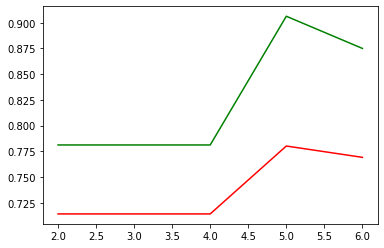

In [15]:
# Doing the same for max_leaf_nodes
# max_leaf_nodes = 5 looks like working the best
k = 7
scores_val = []
scores_test = []
for i in range(2,k):
    heart_dec_tree_model = DecisionTreeClassifier(max_depth = 3, max_leaf_nodes = i, random_state = 101)
    heart_dec_tree_model.fit(X_train, y_train)
    scores_val.append(heart_dec_tree_model.score(X_val, y_val))
    scores_test.append(heart_dec_tree_model.score(X_test, y_test))

plt.plot([i for i in range(2,k)], scores_val, 'g')
plt.plot([i for i in range(2,k)], scores_test, 'r')

## Random Forest

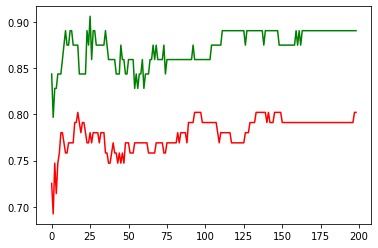

In [16]:
from sklearn.ensemble import RandomForestClassifier
k = 200
scores_val = []
scores_test = []
for i in range(1,k):
    heart_rand_forest_model = RandomForestClassifier(n_estimators = i, random_state = 101)
    heart_rand_forest_model.fit(X_train, y_train)
    scores_val.append(heart_rand_forest_model.score(X_val, y_val))
    scores_test.append(heart_rand_forest_model.score(X_test, y_test))
plt.plot([i for i in range(len(scores_val))], scores_val, 'g')
plt.plot([i for i in range(len(scores_test))], scores_test, 'r')
# Works well at n_estimators = 200

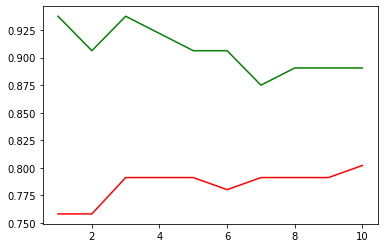

In [17]:
k = 11
scores_val = []
scores_test = []
for i in range(1,k):
    heart_rand_forest_model = RandomForestClassifier(n_estimators = 200, max_depth = i, random_state = 101)
    heart_rand_forest_model.fit(X_train, y_train)
    scores_val.append(heart_rand_forest_model.score(X_val, y_val))
    scores_test.append(heart_rand_forest_model.score(X_test, y_test))
plt.plot([i for i in range(1,k)], scores_val, 'g')
plt.plot([i for i in range(1,k)], scores_test, 'r')
# Works best at max_depth = 10

### Comparing both the models

In [25]:
heart_dec_tree_model = DecisionTreeClassifier(max_depth = 2, max_leaf_nodes = 5, random_state = 101)
heart_rand_forest_model = RandomForestClassifier(n_estimators = 200, max_depth = 10, random_state = 101)
heart_rand_forest_model.fit(X_train, y_train)
heart_dec_tree_model.fit(X_train, y_train)
print(heart_dec_tree_model.score(X_val, y_val))
print(heart_rand_forest_model.score(X_val, y_val))

0.78125
0.890625


In [27]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(heart_rand_forest_model.predict(X_test), y_test))
print(classification_report(heart_rand_forest_model.predict(X_test), y_test))

[[43 12]
 [ 6 30]]
              precision    recall  f1-score   support

           0       0.88      0.78      0.83        55
           1       0.71      0.83      0.77        36

    accuracy                           0.80        91
   macro avg       0.80      0.81      0.80        91
weighted avg       0.81      0.80      0.80        91

